In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.cluster import KMeans, AgglomerativeClustering

In [2]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [3]:
#show all columns
pd.set_option('display.max_columns', None)

# Cleaning

## Set up and merging

In [4]:
rank = pd.read_csv('colleges.csv')
rank.head()

,Unnamed: 0,College Name,Tuition,Enrollment Numbers
0,0,Princeton University,56010,4773
1,1,Columbia University,63530,6170
2,2,Harvard University,55587,5222
3,3,Massachusetts Institute of Technology,55878,4361
4,4,Yale University,59950,4703


In [5]:
rank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 392 entries, 0 to 391
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Unnamed: 0          392 non-null    int64 
 1   College Name        392 non-null    object
 2   Tuition             392 non-null    int64 
 3   Enrollment Numbers  392 non-null    int64 
dtypes: int64(3), object(1)
memory usage: 12.4+ KB


In [6]:
rank.rename(columns={'Unnamed: 0':'Rank','College Name':'Name'}, inplace=True)

In [7]:
college_data = pd.read_csv('Data-Table 1.csv')
college_data.head()

,Name,Applicants total,Admissions total,Enrolled total,Percent of freshmen submitting SAT scores,Percent of freshmen submitting ACT scores,SAT Critical Reading 25th percentile score,SAT Critical Reading 75th percentile score,SAT Math 25th percentile score,SAT Math 75th percentile score,SAT Writing 25th percentile score,SAT Writing 75th percentile score,ACT Composite 25th percentile score,ACT Composite 75th percentile score,State abbreviation,Geographic region,Control of institution,Historically Black College or University,Degree of urbanization (Urban centric locale),Carnegie Classification 2010: Basic,Total enrollment,Full time enrollment,Part time enrollment,Undergraduate enrollment,Graduate enrollment,Full time undergraduate enrollment,Part time undergraduate enrollment,Percent of total enrollment that are Asian,Percent of total enrollment that are Black or African American,Percent of total enrollment that are Hispanic/Latino,Percent of total enrollment that are Native Hawaiian or Other Pacific Islander,Percent of total enrollment that are White,Percent of total enrollment that are two or more races,Percent of total enrollment that are Nonresident Alien,Percent of total enrollment that are women,Percent of undergraduate enrollment that are American Indian or Alaska Native,Number of first time undergraduates in state,Number of first time undergraduates out of state,Number of first time undergraduates foreign countries,Number of first time undergraduates residence unknown,"Graduation rate Bachelor degree within 4 years, total","Graduation rate Bachelor degree within 5 years, total","Graduation rate Bachelor degree within 6 years, total",Percent of freshmen receiving any financial aid,Percent of freshmen receiving federal grant aid,Percent of freshmen receiving Pell grants,Percent of freshmen receiving institutional grant aid,Percent of freshmen receiving student loan aid,Endowment assets
0,Alabama A & M University,6142.000,5521.000,1104.000,15.000,88.000,370.000,450.000,350.000,450.000,NaN,NaN,15.000,19.000,Alabama,Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Public,Yes,City: Midsize,Master's Colleges and Universities (larger pro...,5020.000,4439.000,581.000,4051.000,969.000,3799.000,252.000,1.000,92.000,1.000,0.000,5.000,0.000,0.000,55.000,0.000,NaN,NaN,NaN,NaN,10.000,23.000,29.000,97.000,81.000,81.000,32.000,89.000,0
1,University of Alabama at Birmingham,5689.000,4934.000,1773.000,6.000,93.000,520.000,640.000,520.000,650.000,NaN,NaN,22.000,28.000,Alabama,Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Public,No,City: Midsize,Research Universities (very high research acti...,18568.000,11961.000,6607.000,11502.000,7066.000,8357.000,3145.000,5.000,21.000,3.000,0.000,64.000,3.000,3.000,61.000,0.000,1529.000,224.000,19.000,1.000,29.000,46.000,53.000,90.000,36.000,36.000,60.000,56.000,24136
2,Amridge University,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alabama,Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Private not for profit,No,City: Midsize,Baccalaureate Colleges Arts & Sciences,631.000,323.000,308.000,322.000,309.000,202.000,120.000,0.000,40.000,1.000,0.000,30.000,0.000,0.000,58.000,0.000,NaN,NaN,NaN,NaN,0.000,0.000,67.000,100.000,90.000,90.000,90.000,100.000,302
3,University of Alabama at Huntsville,2054.000,1656.000,651.000,34.000,94.000,510.000,640.000,510.000,650.000,NaN,NaN,23.000,29.000,Alabama,Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Public,No,City: Midsize,Research Universities (very high research acti...,7376.000,4802.000,2574.000,5696.000,1680.000,4237.000,1459.000,4.000,12.000,3.000,0.000,69.000,1.000,6.000,44.000,1.000,514.000,92.000,27.000,18.000,16.000,37.000,48.000,87.000,31.000,31.000,63.000,46.000,11502
4,Alabama State University,10245.000,5251.000,1479.000,18.000,87.000,380.000,480.000,370.000,480.000,NaN,NaN,15.000,19.000,Alabama,Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Public,Yes,City: Midsize,Master's Colleges and Universities (larger pro...,6075.000,5182.000,893.000,5356.000,719.000,4

In [8]:
#nulls for each column
college_data.isnull().sum()

Name                                                                                0
Applicants total                                                                  157
Admissions total                                                                  157
Enrolled total                                                                    157
Percent of freshmen submitting SAT scores                                         277
Percent of freshmen submitting ACT scores                                         275
SAT Critical Reading 25th percentile score                                        365
SAT Critical Reading 75th percentile score                                        365
SAT Math 25th percentile score                                                    352
SAT Math 75th percentile score                                                    352
SAT Writing 25th percentile score                                                 820
SAT Writing 75th percentile score                     

In [9]:
college_data.columns

Index(['Name', 'Applicants total', 'Admissions total', 'Enrolled total',
       'Percent of freshmen submitting SAT scores',
       'Percent of freshmen submitting ACT scores',
       'SAT Critical Reading 25th percentile score',
       'SAT Critical Reading 75th percentile score',
       'SAT Math 25th percentile score', 'SAT Math 75th percentile score',
       'SAT Writing 25th percentile score',
       'SAT Writing 75th percentile score',
       'ACT Composite 25th percentile score',
       'ACT Composite 75th percentile score', 'State abbreviation',
       'Geographic region', 'Control of institution',
       'Historically Black College or University',
       'Degree of urbanization (Urban centric locale)',
       'Carnegie Classification 2010: Basic', 'Total enrollment',
       'Full time enrollment', 'Part time enrollment',
       'Undergraduate enrollment', 'Graduate enrollment',
       'Full time undergraduate enrollment',
       'Part time undergraduate enrollment',
       'Pe

In [10]:
college_data['Name'] = college_data['Name'].str.replace('[#,@,&,+,*,%,$,^,!,~,.]', '')
college_data['Name'] = college_data['Name'].str.replace('The ', '')
college_data['Name'] = college_data['Name'].str.replace(' at ', ' ')
college_data['Name'] = college_data['Name'].str.replace('Main Campus', '')
college_data['Name'] = college_data['Name'].str.replace(' and ',' ')
college_data['Name'] = college_data['Name'].str.replace('  ', ' ')
college_data['Name'] = college_data['Name'].str.strip()

C:\Users\jesse\AppData\Local\Temp\ipykernel_9784\904618103.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  college_data['Name'] = college_data['Name'].str.replace('[#,@,&,+,*,%,$,^,!,~,.]', '')


In [11]:
rank['Name'] = rank['Name'].str.replace('[#,@,&,+,*,%,$,^,!,~,.]', '')
rank['Name'] = rank['Name'].str.replace('The ', '')
rank['Name'] = rank['Name'].str.replace(' at ', ' ')
rank['Name'] = rank['Name'].str.replace(' and ',' ')
rank['Name'] = rank['Name'].str.replace('--', ' ')
rank['Name'] = rank['Name'].str.replace('-', ' ')
rank['Name'] = rank['Name'].str.replace('  ', ' ')
rank['Name'] = rank['Name'].str.strip()

C:\Users\jesse\AppData\Local\Temp\ipykernel_9784\3916203632.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  rank['Name'] = rank['Name'].str.replace('[#,@,&,+,*,%,$,^,!,~,.]', '')


In [12]:
#merge the two dataframes on the college name
data = pd.merge(rank, college_data, on='Name', how='outer')
data.head()

,Rank,Name,Tuition,Enrollment Numbers,Applicants total,Admissions total,Enrolled total,Percent of freshmen submitting SAT scores,Percent of freshmen submitting ACT scores,SAT Critical Reading 25th percentile score,SAT Critical Reading 75th percentile score,SAT Math 25th percentile score,SAT Math 75th percentile score,SAT Writing 25th percentile score,SAT Writing 75th percentile score,ACT Composite 25th percentile score,ACT Composite 75th percentile score,State abbreviation,Geographic region,Control of institution,Historically Black College or University,Degree of urbanization (Urban centric locale),Carnegie Classification 2010: Basic,Total enrollment,Full time enrollment,Part time enrollment,Undergraduate enrollment,Graduate enrollment,Full time undergraduate enrollment,Part time undergraduate enrollment,Percent of total enrollment that are Asian,Percent of total enrollment that are Black or African American,Percent of total enrollment that are Hispanic/Latino,Percent of total enrollment that are Native Hawaiian or Other Pacific Islander,Percent of total enrollment that are White,Percent of total enrollment that are two or more races,Percent of total enrollment that are Nonresident Alien,Percent of total enrollment that are women,Percent of undergraduate enrollment that are American Indian or Alaska Native,Number of first time undergraduates in state,Number of first time undergraduates out of state,Number of first time undergraduates foreign countries,Number of first time undergraduates residence unknown,"Graduation rate Bachelor degree within 4 years, total","Graduation rate Bachelor degree within 5 years, total","Graduation rate Bachelor degree within 6 years, total",Percent of freshmen receiving any financial aid,Percent of freshmen receiving federal grant aid,Percent of freshmen receiving Pell grants,Percent of freshmen receiving institutional grant aid,Percent of freshmen receiving student loan aid,Endowment assets
0,0.000,Princeton University,56010.000,4773.000,26499.000,1963.000,1285.000,86.000,33.000,700.000,800.000,710.000,800.000,710.000,790.000,31.000,35.000,New Jersey,Mid East DE DC MD NJ NY PA,Private not for profit,No,Suburb: Large,Research Universities (very high research acti...,8014.000,7935.000,79.000,5323.000,2691.000,5244.000,79.000,15.000,6.000,7.000,0.000,45.000,4.000,20.000,45.000,0.000,197.000,929.000,157.000,1.000,88.000,95.000,97.000,60.000,14.000,14.000,60.000,9.000,2320421.000
1,1.000,Columbia University,63530.000,6170.000,31851.000,2362.000,1415.000,90.000,32.000,690.000,780.000,700.000,790.000,690.000,780.000,31.000,34.000,New York,Mid East DE DC MD NJ NY PA,Private not for profit,No,City: Large,Research Universities (very high research acti...,26957.000,22731.000,4226.000,7970.000,18987.000,7374.000,596.000,13.000,5.000,8.000,0.000,36.000,3.000,28.000,51.000,1.000,324.000,961.000,224.000,0.000,86.000,92.000,93.000,57.000,15.000,15.000,49.000,16.000,316753.000
2,2.000,Harvard University,55587.000,5222.000,35023.000,2047.000,1659.000,86.000,38.000,700.000,800.000,710.000,800.000,710.000,800.000,32.000,35.000,Massachusetts,New England CT ME MA NH RI VT,Private not for profit,No,City: Midsize,Research Universities (very high research acti...,28297.000,20370.000,7927.000,10534.000,17763.000,7240.000,3294.000,13.000,5.000,7.000,0.000,45.000,3.000,21.000,49.000,0.000,NaN,NaN,NaN,NaN,87.000,95.000,97.000,75.000,15.000,15.000,58.000,9.000,1392761.000
3,3.000,Massachusetts Institute of Technology,55878.000,4361.000,18989.000,1548.000,1115.000,85.000,40.000,680.000,770.000,750.000,800.000,690.000,780.000,33.000,35.000,Massachusetts,New England CT ME MA NH RI VT,Private not for profit,No,City: Midsize,Research Universities (very high research acti...,11301.000,11138.000,163.000,4528.000,6773.000,4499.000,29.000,16.000,3.000,9.000,0.000,34.000,3.000,29.000,37.000,0.000,75.000,929.000,110.000,1.000,84.000,91.000,93.000,87.000,18.000,16.000,55.000,19.000,980404.000
4,4.000,Yale University,59950.000,4703.000,289

In [13]:
just_rank = data[(data['Rank'].notnull())&(data['Applicants total'].isnull())]
just_rank.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27 entries, 52 to 392
Data columns (total 52 columns):
 #   Column                                                                          Non-Null Count  Dtype  
---  ------                                                                          --------------  -----  
 0   Rank                                                                            27 non-null     float64
 1   Name                                                                            27 non-null     object 
 2   Tuition                                                                         27 non-null     float64
 3   Enrollment Numbers                                                              27 non-null     float64
 4   Applicants total                                                                0 non-null      float64
 5   Admissions total                                                                0 non-null      float64
 6   Enrolled total    

In [14]:
just_rank = just_rank[just_rank['Endowment assets'].isnull()]

In [15]:
just_rank['Name'].unique()

array(['Purdue University West Lafayette',
       'Pennsylvania State University University Park',
       'University of California Merced', 'Thomas Jefferson University',
       'Russell Sage College',
       'Inter American University of Puerto Rico San German',
       'Tennessee Techn University', 'Long Island University',
       'University of Puerto Rico Rio Piedras', 'Augusta University',
       'Colorado Technical University', 'Grand Canyon University',
       'Inter American University of Puerto Rico Metropolitan Campus',
       'Keiser University', 'Mary Baldwin University',
       'Pontifical Catholic University of Puerto Rico Ponce',
       'Universidad Ana G Mendez Gurabo Campus', 'University of Phoenix',
       'University of Texas Rio Grande Valley'], dtype=object)

In [16]:
data.drop(just_rank.index, inplace=True)

In [17]:
data[data['Name']=='University of Texas Rio Grande Valley']

,Rank,Name,Tuition,Enrollment Numbers,Applicants total,Admissions total,Enrolled total,Percent of freshmen submitting SAT scores,Percent of freshmen submitting ACT scores,SAT Critical Reading 25th percentile score,SAT Critical Reading 75th percentile score,SAT Math 25th percentile score,SAT Math 75th percentile score,SAT Writing 25th percentile score,SAT Writing 75th percentile score,ACT Composite 25th percentile score,ACT Composite 75th percentile score,State abbreviation,Geographic region,Control of institution,Historically Black College or University,Degree of urbanization (Urban centric locale),Carnegie Classification 2010: Basic,Total enrollment,Full time enrollment,Part time enrollment,Undergraduate enrollment,Graduate enrollment,Full time undergraduate enrollment,Part time undergraduate enrollment,Percent of total enrollment that are Asian,Percent of total enrollment that are Black or African American,Percent of total enrollment that are Hispanic/Latino,Percent of total enrollment that are Native Hawaiian or Other Pacific Islander,Percent of total enrollment that are White,Percent of total enrollment that are two or more races,Percent of total enrollment that are Nonresident Alien,Percent of total enrollment that are women,Percent of undergraduate enrollment that are American Indian or Alaska Native,Number of first time undergraduates in state,Number of first time undergraduates out of state,Number of first time undergraduates foreign countries,Number of first time undergraduates residence unknown,"Graduation rate Bachelor degree within 4 years, total","Graduation rate Bachelor degree within 5 years, total","Graduation rate Bachelor degree within 6 years, total",Percent of freshmen receiving any financial aid,Percent of freshmen receiving federal grant aid,Percent of freshmen receiving Pell grants,Percent of freshmen receiving institutional grant aid,Percent of freshmen receiving student loan aid,Endowment assets


In [18]:
just_data = data[(data['Rank'].isnull())&(data['Applicants total'].notnull())]
just_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1010 entries, 394 to 1551
Data columns (total 52 columns):
 #   Column                                                                          Non-Null Count  Dtype  
---  ------                                                                          --------------  -----  
 0   Rank                                                                            0 non-null      float64
 1   Name                                                                            1010 non-null   object 
 2   Tuition                                                                         0 non-null      float64
 3   Enrollment Numbers                                                              0 non-null      float64
 4   Applicants total                                                                1010 non-null   float64
 5   Admissions total                                                                1010 non-null   float64
 6   Enrolled total

In [19]:
complete = data[(data['Rank'].notnull())&(data['Applicants total'].notnull())]
complete.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 367 entries, 0 to 393
Data columns (total 52 columns):
 #   Column                                                                          Non-Null Count  Dtype  
---  ------                                                                          --------------  -----  
 0   Rank                                                                            367 non-null    float64
 1   Name                                                                            367 non-null    object 
 2   Tuition                                                                         367 non-null    float64
 3   Enrollment Numbers                                                              367 non-null    float64
 4   Applicants total                                                                367 non-null    float64
 5   Admissions total                                                                367 non-null    float64
 6   Enrolled total    

In [20]:
just_rank.to_csv('just_rank.csv')

## Prep for modeling

### Preprocessing

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1534 entries, 0 to 1552
Data columns (total 52 columns):
 #   Column                                                                          Non-Null Count  Dtype  
---  ------                                                                          --------------  -----  
 0   Rank                                                                            375 non-null    float64
 1   Name                                                                            1534 non-null   object 
 2   Tuition                                                                         375 non-null    float64
 3   Enrollment Numbers                                                              375 non-null    float64
 4   Applicants total                                                                1377 non-null   float64
 5   Admissions total                                                                1377 non-null   float64
 6   Enrolled total  

In [22]:
data.dropna(subset=['Rank'], inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 375 entries, 0 to 393
Data columns (total 52 columns):
 #   Column                                                                          Non-Null Count  Dtype  
---  ------                                                                          --------------  -----  
 0   Rank                                                                            375 non-null    float64
 1   Name                                                                            375 non-null    object 
 2   Tuition                                                                         375 non-null    float64
 3   Enrollment Numbers                                                              375 non-null    float64
 4   Applicants total                                                                367 non-null    float64
 5   Admissions total                                                                367 non-null    float64
 6   Enrolled total    

In [23]:
#columns with no nulls
data.columns[data.isnull().sum()<=30]

Index(['Rank', 'Name', 'Tuition', 'Enrollment Numbers', 'Applicants total',
       'Admissions total', 'Enrolled total',
       'Percent of freshmen submitting SAT scores',
       'Percent of freshmen submitting ACT scores', 'State abbreviation',
       'Geographic region', 'Control of institution',
       'Historically Black College or University',
       'Degree of urbanization (Urban centric locale)',
       'Carnegie Classification 2010: Basic', 'Total enrollment',
       'Full time enrollment', 'Part time enrollment',
       'Undergraduate enrollment', 'Graduate enrollment',
       'Full time undergraduate enrollment',
       'Part time undergraduate enrollment',
       'Percent of total enrollment that are Asian',
       'Percent of total enrollment that are Black or African American',
       'Percent of total enrollment that are Hispanic/Latino',
       'Percent of total enrollment that are Native Hawaiian or Other Pacific Islander',
       'Percent of total enrollment that are 

In [24]:
df = data[[ 'Name','Rank','Tuition', 'Enrollment Numbers', 'Applicants total',
       'Admissions total',
       'Geographic region', 'Control of institution',
       'Historically Black College or University',
       'Degree of urbanization (Urban centric locale)',
       'Carnegie Classification 2010: Basic',
       'Undergraduate enrollment', 'Graduate enrollment',
       'Full time undergraduate enrollment',
       'Part time undergraduate enrollment',
       'Percent of total enrollment that are Asian',
       'Percent of total enrollment that are Black or African American',
       'Percent of total enrollment that are Hispanic/Latino',
       'Percent of total enrollment that are Native Hawaiian or Other Pacific Islander',
       'Percent of total enrollment that are White',
       'Percent of total enrollment that are women',
       'Percent of undergraduate enrollment that are American Indian or Alaska Native',
       'Graduation rate  Bachelor degree within 4 years, total',
       'Percent of freshmen receiving any financial aid',
       'Endowment assets']]

In [25]:
df = df.dropna()

In [26]:
df.dtypes

Name                                                                               object
Rank                                                                              float64
Tuition                                                                           float64
Enrollment Numbers                                                                float64
Applicants total                                                                  float64
Admissions total                                                                  float64
Geographic region                                                                  object
Control of institution                                                             object
Historically Black College or University                                           object
Degree of urbanization (Urban centric locale)                                      object
Carnegie Classification 2010: Basic                                                object
Undergradu

In [27]:
df

,Name,Rank,Tuition,Enrollment Numbers,Applicants total,Admissions total,Geographic region,Control of institution,Historically Black College or University,Degree of urbanization (Urban centric locale),Carnegie Classification 2010: Basic,Undergraduate enrollment,Graduate enrollment,Full time undergraduate enrollment,Part time undergraduate enrollment,Percent of total enrollment that are Asian,Percent of total enrollment that are Black or African American,Percent of total enrollment that are Hispanic/Latino,Percent of total enrollment that are Native Hawaiian or Other Pacific Islander,Percent of total enrollment that are White,Percent of total enrollment that are women,Percent of undergraduate enrollment that are American Indian or Alaska Native,"Graduation rate Bachelor degree within 4 years, total",Percent of freshmen receiving any financial aid,Endowment assets
0,Princeton University,0.000,56010.000,4773.000,26499.000,1963.000,Mid East DE DC MD NJ NY PA,Private not for profit,No,Suburb: Large,Research Universities (very high research acti...,5323.000,2691.000,5244.000,79.000,15.000,6.000,7.000,0.000,45.000,45.000,0.000,88.000,60.000,2320421.000
1,Columbia University,1.000,63530.000,6170.000,31851.000,2362.000,Mid East DE DC MD NJ NY PA,Private not for profit,No,City: Large,Research Universities (very high research acti...,7970.000,18987.000,7374.000,596.000,13.000,5.000,8.000,0.000,36.000,51.000,1.000,86.000,57.000,316753.000
2,Harvard University,2.000,55587.000,5222.000,35023.000,2047.000,New England CT ME MA NH RI VT,Private not for profit,No,City: Midsize,Research Universities (very high research acti...,10534.000,17763.000,7240.000,3294.000,13.000,5.000,7.000,0.000,45.000,49.000,0.000,87.000,75.000,1392761.000
3,Massachusetts Institute of Technology,3.000,55878.000,4361.000,18989.000,1548.000,New England CT ME MA NH RI VT,Private not for profit,No,City: Midsize,Research Universities (very high research acti...,4528.000,6773.000,4499.000,29.000,16.000,3.000,9.000,0.000,34.000,37.000,0.000,84.000,87.000,980404.000
4,Yale University,4.000,59950.000,4703.000,28977.000,2043.000,New England CT ME MA NH RI VT,Private not for profit,No,City: Midsize,Research Universities (very high research acti...,5430.000,6679.000,5424.000,6.000,13.000,5.000,7.000,0.000,48.000,49.000,1.000,90.000,61.000,1528324.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,Western Kentucky University,384.000,26496.000,15286.000,8526.000,7871.000,Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Public,No,City: Small,Master's Colleges and Universities (larger pro...,17509.000,2939.000,13382.000,4127.000,1.000,10.000,2.000,0.000,77.000,58.000,0.000,25.000,93.000,945.000
387,Wichita State University,385.000,18166.000,12406.000,3492.000,3344.000,Plains IA KS MN MO NE ND SD,Public,No,City: Large,Research Universities (high research activity),11670.000,2716.000,8807.000,2863.000,6.000,6.000,8.000,0.000,63.000,52.000,1.000,22.000,89.000,17845.000
388,William Carey University,386.000,14100.000,3264.000,771.000,376.000,Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Private not for profit,No,City: Small,Master's Colleges and Universities (larger pro...,2257.000,1625.000,1886.000,371.000,3.000,27.000,2.000,0.000,64.000,66.000,1.000,46.000,92.000,2958.000
389,William Woods University,387.000,25930.000,873.000,897.000,674.000,Plains IA KS MN MO NE ND SD,Private not for profit,No,Town: Distant,Master's Colleges and Universities (larger pro...,1002.000,1134.000,843.000,159.000,1.000,3.000,1.000,0.000,84.000,68.000,0.000,45.000,100.000,11097.000


In [28]:
df['Enrollment Numbers'] = df['Undergraduate enrollment'] + df['Graduate enrollment']
df['Percent undergraduate'] = df['Undergraduate enrollment']/(df['Enrollment Numbers'])
df['Percent fulltime'] = df['Full time undergraduate enrollment']/(df['Undergraduate enrollment'])
df['Percent admitted'] = df['Admissions total']/(df['Applicants total'])

In [29]:
df['Geographic region'].unique()

array(['Mid East DE DC MD NJ NY PA', 'New England CT ME MA NH RI VT',
       'Far West AK CA HI NV OR WA', 'Great Lakes IL IN MI OH WI',
       'Southeast AL AR FL GA KY LA MS NC SC TN VA WV',
       'Plains IA KS MN MO NE ND SD', 'Southwest AZ NM OK TX',
       'Rocky Mountains CO ID MT UT WY'], dtype=object)

In [30]:
df['Control of institution'].unique()

array(['Private not for profit', 'Public'], dtype=object)

In [31]:
df['Historically Black College or University'].unique()

array(['No', 'Yes'], dtype=object)

In [32]:
df['Degree of urbanization (Urban centric locale)'].unique()

array(['Suburb: Large', 'City: Large', 'City: Midsize', 'City: Small',
       'Town: Remote', 'Suburb: Midsize', 'Suburb: Small', 'Town: Fringe',
       'Rural: Fringe', 'Town: Distant'], dtype=object)

In [33]:
df['Carnegie Classification 2010: Basic'].unique()

array(['Research Universities (very high research activity)',
       'Research Universities (high research activity)',
       'Doctoral/Research Universities',
       "Master's Colleges and Universities (larger programs)",
       "Master's Colleges and Universities (smaller programs)",
       "Master's Colleges and Universities (medium programs)",
       'Baccalaureate Colleges Diverse Fields',
       'Baccalaureate Colleges Arts & Sciences'], dtype=object)

In [34]:
df.columns

Index(['Name', 'Rank', 'Tuition', 'Enrollment Numbers', 'Applicants total',
       'Admissions total', 'Geographic region', 'Control of institution',
       'Historically Black College or University',
       'Degree of urbanization (Urban centric locale)',
       'Carnegie Classification 2010: Basic', 'Undergraduate enrollment',
       'Graduate enrollment', 'Full time undergraduate enrollment',
       'Part time undergraduate enrollment',
       'Percent of total enrollment that are Asian',
       'Percent of total enrollment that are Black or African American',
       'Percent of total enrollment that are Hispanic/Latino',
       'Percent of total enrollment that are Native Hawaiian or Other Pacific Islander',
       'Percent of total enrollment that are White',
       'Percent of total enrollment that are women',
       'Percent of undergraduate enrollment that are American Indian or Alaska Native',
       'Graduation rate  Bachelor degree within 4 years, total',
       'Percent of 

In [35]:
df.describe()

,Rank,Tuition,Enrollment Numbers,Applicants total,Admissions total,Undergraduate enrollment,Graduate enrollment,Full time undergraduate enrollment,Part time undergraduate enrollment,Percent of total enrollment that are Asian,Percent of total enrollment that are Black or African American,Percent of total enrollment that are Hispanic/Latino,Percent of total enrollment that are Native Hawaiian or Other Pacific Islander,Percent of total enrollment that are White,Percent of total enrollment that are women,Percent of undergraduate enrollment that are American Indian or Alaska Native,"Graduation rate Bachelor degree within 4 years, total",Percent of freshmen receiving any financial aid,Endowment assets,Percent undergraduate,Percent fulltime,Percent admitted
count,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000
mean,187.227,34593.723,16898.238,13867.986,7260.882,12326.797,4571.441,10476.556,1850.241,6.192,10.605,8.907,0.074,58.414,55.340,0.321,42.118,86.299,62104.348,0.708,0.852,0.622
std,110.507,13681.923,12481.095,12524.285,5869.563,9643.301,3992.240,8268.793,2311.730,6.417,13.882,9.987,0.609,18.201,9.366,0.744,21.973,12.326,199648.073,0.135,0.112,0.208
min,0.000,-1.000,1225.000,84.000,83.000,973.000,214.000,611.000,0.000,0.000,0.000,1.000,0.000,0.000,23.000,0.000,0.000,44.000,0.000,0.201,0.373,0.057
25%,93.000,24110.000,6747.000,4801.000,2764.000,4428.000,1887.000,3815.000,359.000,2.000,4.000,3.000,0.000,48.000,51.000,0.000,24.000,79.000,6274.000,0.632,0.785,0.507
50%,185.000,32299.000,13868.000,10525.000,5529.000,9718.000,3335.000,8040.000,1091.000,4.000,6.000,6.000,0.000,62.000,55.000,0.000,38.000,90.000,14574.000,0.745,0.880,0.655
75%,277.000,44382.000,24629.000,18989.000,10405.000,18615.000,5789.000,15879.000,2664.000,8.000,12.000,10.000,0.000,72.000,60.000,0.000,59.000,96.000,36852.000,0.813,0.937,0.774
max,389.000,63530.000,77338.000,72676.000,35815.000,51333.000,29874.000,40020.000,21553.000,39.000,91.000,79.000,10.000,94.000,95.000,6.000,90.000,100.000,2320421.000,0.918,1.000,1.000


In [36]:
df_small = df[['Name', 'Rank', 'Tuition', 'Enrollment Numbers', 'Geographic region', 'Control of institution',
       'Historically Black College or University',
       'Degree of urbanization (Urban centric locale)',
       'Carnegie Classification 2010: Basic',
       'Percent of total enrollment that are White',
       'Percent of total enrollment that are women',
       'Graduation rate  Bachelor degree within 4 years, total',
       'Percent of freshmen receiving any financial aid', 'Endowment assets',
       'Percent undergraduate', 'Percent fulltime', 'Percent admitted']]

### Clustering

In [134]:
sns.pairplot(df_small)

KeyboardInterrupt: 

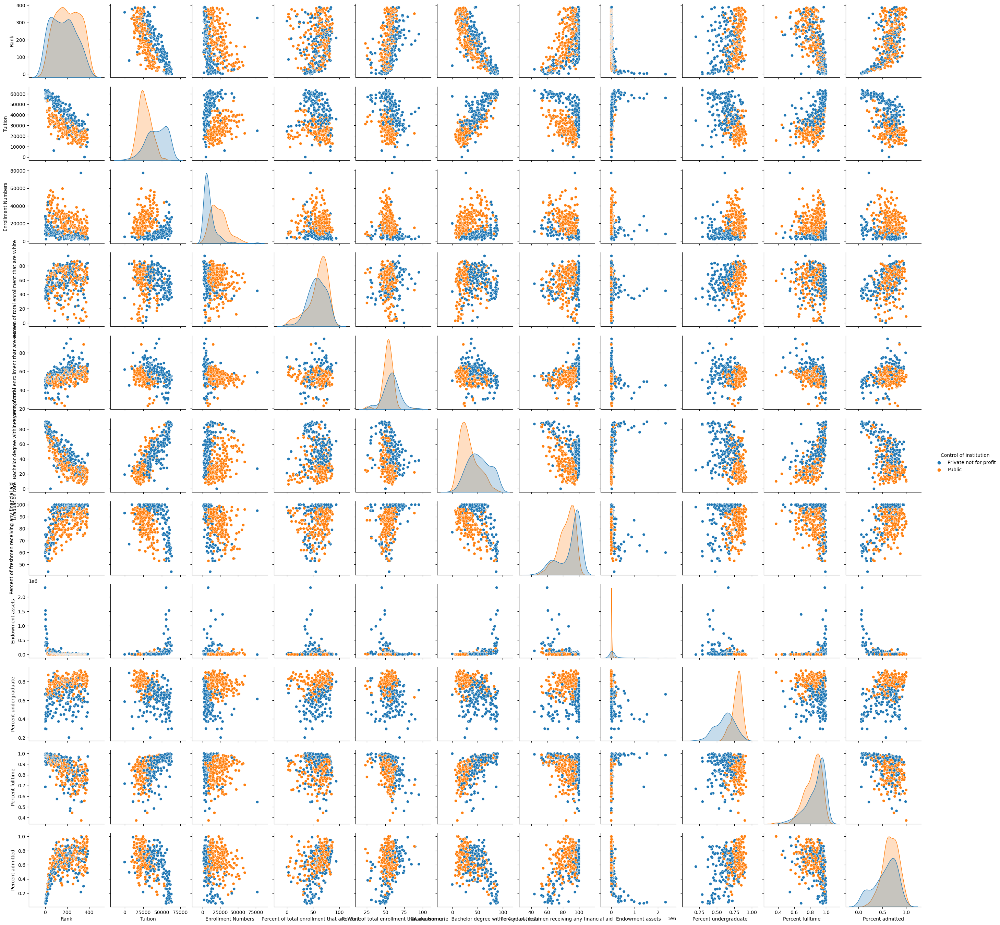

In [ ]:
sns.pairplot(df_small, hue = 'Control of institution')

Private - public split does have a pretty clear distinction for a lot of the graphs, particularly for tuition, enrollment size, and percent undergraduate

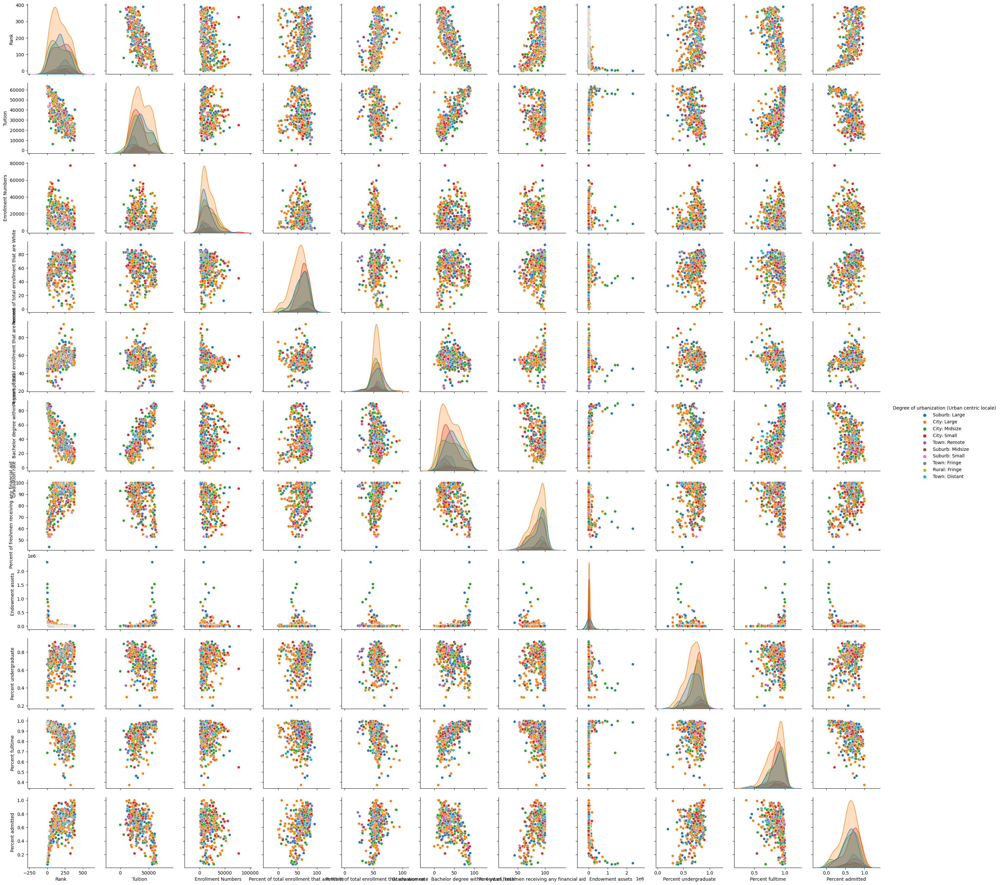

In [ ]:
sns.pairplot(df_small, hue = 'Degree of urbanization (Urban centric locale)')

Strong blend -- no super distinct splits.

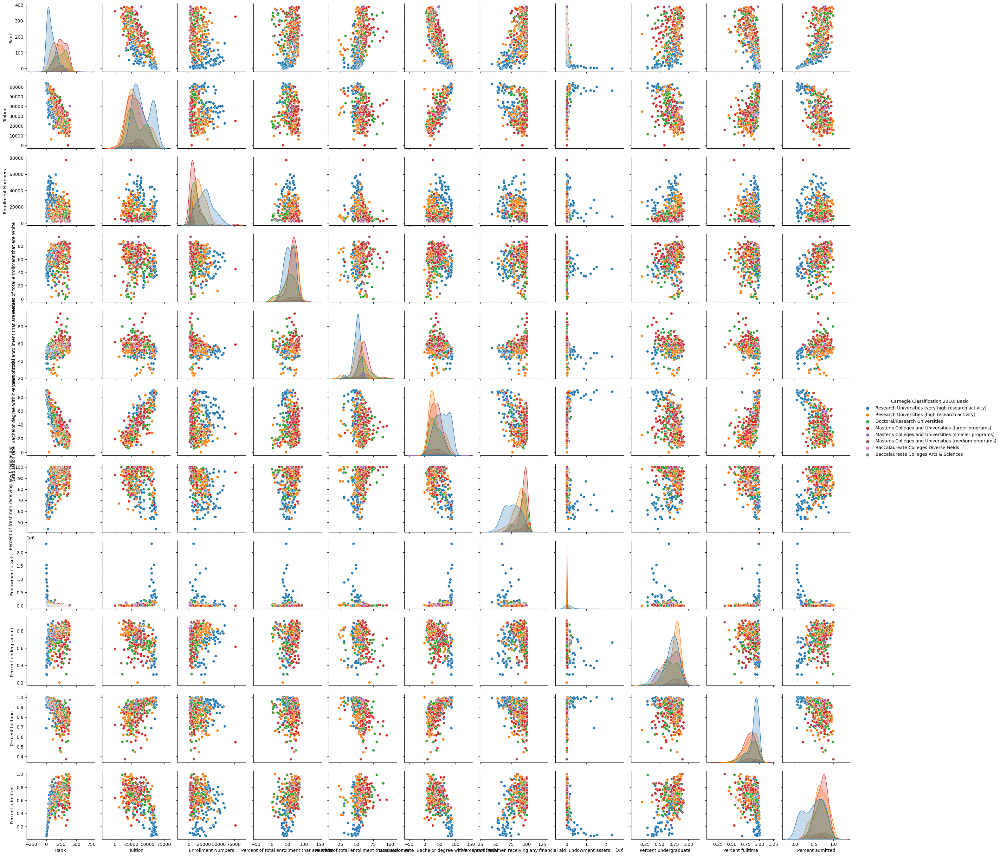

In [ ]:
sns.pairplot(df_small, hue = 'Carnegie Classification 2010: Basic')

Very high research universities tend to appear near each other on many graphs, as do high research unviersities and large masters programs. However, there is still a lot of blending and non-destinct clustering.

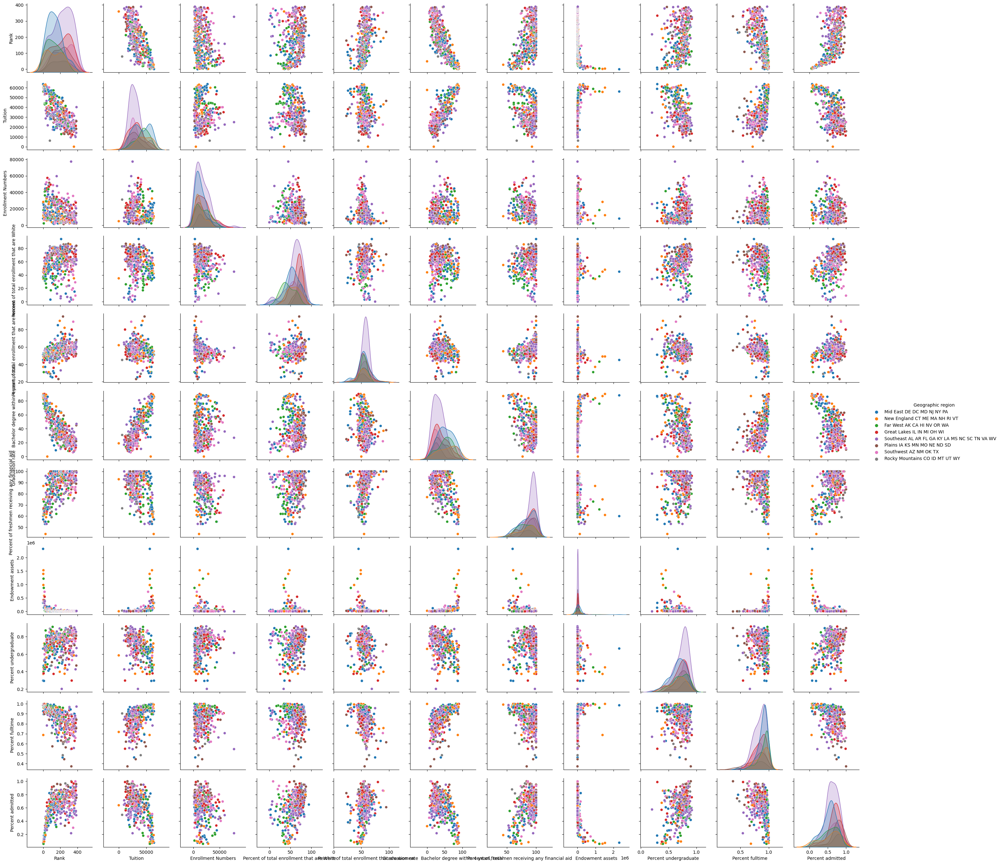

In [ ]:
sns.pairplot(df_small, hue = 'Geographic region')

Very blended, little to no distinct splits.

Correlations -- many things correlate with "total," which makes sense since that is just the sum of all the stats

A lot of correlation between variables, including rank, tuition, and graduating within four years. Other strongly correlated variables include percent admitted, and endowment assets. The categorical variables are also strongly correlated with several things. PCA will thus be valuable for clustering. 

### More preprocessing

In [37]:
df_small['Control of institution'] = df_small['Control of institution'].astype('category').cat.codes
df_small['Historically Black College or University'] = df_small['Historically Black College or University'].astype('category').cat.codes

C:\Users\jesse\AppData\Local\Temp\ipykernel_9784\934624594.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_small['Control of institution'] = df_small['Control of institution'].astype('category').cat.codes
C:\Users\jesse\AppData\Local\Temp\ipykernel_9784\934624594.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_small['Historically Black College or University'] = df_small['Historically Black College or University'].astype('category').cat.codes


In [38]:
#convert categorical variables to dummy variables
df_small = pd.get_dummies(df_small, columns=['Geographic region', 
       'Degree of urbanization (Urban centric locale)',
       'Carnegie Classification 2010: Basic'])

In [39]:
df_small

,Name,Rank,Tuition,Enrollment Numbers,Control of institution,Historically Black College or University,Percent of total enrollment that are White,Percent of total enrollment that are women,"Graduation rate Bachelor degree within 4 years, total",Percent of freshmen receiving any financial aid,Endowment assets,Percent undergraduate,Percent fulltime,Percent admitted,Geographic region_Far West AK CA HI NV OR WA,Geographic region_Great Lakes IL IN MI OH WI,Geographic region_Mid East DE DC MD NJ NY PA,Geographic region_New England CT ME MA NH RI VT,Geographic region_Plains IA KS MN MO NE ND SD,Geographic region_Rocky Mountains CO ID MT UT WY,Geographic region_Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Geographic region_Southwest AZ NM OK TX,Degree of urbanization (Urban centric locale)_City: Large,Degree of urbanization (Urban centric locale)_City: Midsize,Degree of urbanization (Urban centric locale)_City: Small,Degree of urbanization (Urban centric locale)_Rural: Fringe,Degree of urbanization (Urban centric locale)_Suburb: Large,Degree of urbanization (Urban centric locale)_Suburb: Midsize,Degree of urbanization (Urban centric locale)_Suburb: Small,Degree of urbanization (Urban centric locale)_Town: Distant,Degree of urbanization (Urban centric locale)_Town: Fringe,Degree of urbanization (Urban centric locale)_Town: Remote,Carnegie Classification 2010: Basic_Baccalaureate Colleges Arts & Sciences,Carnegie Classification 2010: Basic_Baccalaureate Colleges Diverse Fields,Carnegie Classification 2010: Basic_Doctoral/Research Universities,Carnegie Classification 2010: Basic_Master's Colleges and Universities (larger programs),Carnegie Classification 2010: Basic_Master's Colleges and Universities (medium programs),Carnegie Classification 2010: Basic_Master's Colleges and Universities (smaller programs),Carnegie Classification 2010: Basic_Research Universities (high research activity),Carnegie Classification 2010: Basic_Research Universities (very high research activity)
0,Princeton University,0.000,56010.000,8014.000,0,0,45.000,45.000,88.000,60.000,2320421.000,0.664,0.985,0.074,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
1,Columbia University,1.000,63530.000,26957.000,0,0,36.000,51.000,86.000,57.000,316753.000,0.296,0.925,0.074,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,Harvard University,2.000,55587.000,28297.000,0,0,45.000,49.000,87.000,75.000,1392761.000,0.372,0.687,0.058,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,Massachusetts Institute of Technology,3.000,55878.000,11301.000,0,0,34.000,37.000,84.000,87.000,980404.000,0.401,0.994,0.082,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,Yale University,4.000,59950.000,12109.000,0,0,48.000,49.000,90.000,61.000,1528324.000,0.448,0.999,0.071,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,Western Kentucky University,384.000,26496.000,20448.000,1,0,77.000,58.000,25.000,93.000,945.000,0.856,0.764,0.923,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
387,Wichita State University,385.000,18166.000,14386.000,1,0,63.000,52.000,22.000,89.000,17845.000,0.811,0.755,0.958,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
388,William Carey University,386.000,14100.000,3882.000,0,0,64.000,66.000,46.000,92.000,2958.000,0.581,0.836,0.488,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
389,William Woods University,387.000,25930.000,2136.000,0,0,84.000,68.000,45.000,100.000,11097.000,0.469,0.841,0.751,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0


## Explore Visualization using PCA

In [40]:
#turn all columns into X
X = df_small.drop(['Name'], axis=1)

In [41]:
#Create PCA model
pca = PCA(n_components=2)
pca_mdl = pca.fit_transform(X)
pca_df = pd.DataFrame(pca_mdl)

<Axes: xlabel='0', ylabel='1'>

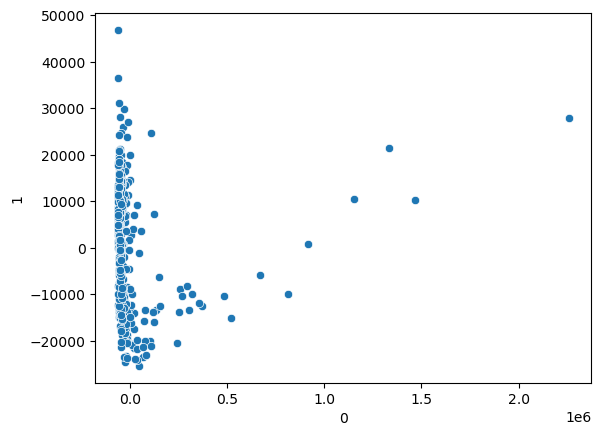

In [42]:
sns.scatterplot(x = pca_df[0], y = pca_df[1])

... okay weird there are definitely some outliers and it looks wonky. How to handle these? We will test outlier removal and data scaling.

In [43]:
X.columns

Index(['Rank', 'Tuition', 'Enrollment Numbers', 'Control of institution',
       'Historically Black College or University',
       'Percent of total enrollment that are White',
       'Percent of total enrollment that are women',
       'Graduation rate  Bachelor degree within 4 years, total',
       'Percent of freshmen receiving any financial aid', 'Endowment assets',
       'Percent undergraduate', 'Percent fulltime', 'Percent admitted',
       'Geographic region_Far West AK CA HI NV OR WA',
       'Geographic region_Great Lakes IL IN MI OH WI',
       'Geographic region_Mid East DE DC MD NJ NY PA',
       'Geographic region_New England CT ME MA NH RI VT',
       'Geographic region_Plains IA KS MN MO NE ND SD',
       'Geographic region_Rocky Mountains CO ID MT UT WY',
       'Geographic region_Southeast AL AR FL GA KY LA MS NC SC TN VA WV',
       'Geographic region_Southwest AZ NM OK TX',
       'Degree of urbanization (Urban centric locale)_City: Large',
       'Degree of urbani

In [44]:
from sklearn.preprocessing import StandardScaler
# scaler = preprocessing.StandardScaler()
# numerical_cols = df_small.select_dtypes(include=['float64', 'int64']).columns
# scaler = StandardScaler()
# df_small[numerical_cols] = scaler.fit_transform(df_small[numerical_cols])
# df_small.describe()
scaler = preprocessing.StandardScaler()
scaled_X = scaler.fit_transform(X)
X = pd.DataFrame(scaled_X, columns=X.columns)
X.describe()

,Rank,Tuition,Enrollment Numbers,Control of institution,Historically Black College or University,Percent of total enrollment that are White,Percent of total enrollment that are women,"Graduation rate Bachelor degree within 4 years, total",Percent of freshmen receiving any financial aid,Endowment assets,Percent undergraduate,Percent fulltime,Percent admitted,Geographic region_Far West AK CA HI NV OR WA,Geographic region_Great Lakes IL IN MI OH WI,Geographic region_Mid East DE DC MD NJ NY PA,Geographic region_New England CT ME MA NH RI VT,Geographic region_Plains IA KS MN MO NE ND SD,Geographic region_Rocky Mountains CO ID MT UT WY,Geographic region_Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Geographic region_Southwest AZ NM OK TX,Degree of urbanization (Urban centric locale)_City: Large,Degree of urbanization (Urban centric locale)_City: Midsize,Degree of urbanization (Urban centric locale)_City: Small,Degree of urbanization (Urban centric locale)_Rural: Fringe,Degree of urbanization (Urban centric locale)_Suburb: Large,Degree of urbanization (Urban centric locale)_Suburb: Midsize,Degree of urbanization (Urban centric locale)_Suburb: Small,Degree of urbanization (Urban centric locale)_Town: Distant,Degree of urbanization (Urban centric locale)_Town: Fringe,Degree of urbanization (Urban centric locale)_Town: Remote,Carnegie Classification 2010: Basic_Baccalaureate Colleges Arts & Sciences,Carnegie Classification 2010: Basic_Baccalaureate Colleges Diverse Fields,Carnegie Classification 2010: Basic_Doctoral/Research Universities,Carnegie Classification 2010: Basic_Master's Colleges and Universities (larger programs),Carnegie Classification 2010: Basic_Master's Colleges and Universities (medium programs),Carnegie Classification 2010: Basic_Master's Colleges and Universities (smaller programs),Carnegie Classification 2010: Basic_Research Universities (high research activity),Carnegie Classification 2010: Basic_Research Universities (very high research activity)
count,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000,365.000
mean,0.000,0.000,0.000,0.000,0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000,0.000,-0.000,0.000,0.000,-0.000,-0.000,0.000,0.000,-0.000,-0.000,-0.000,-0.000,0.000,-0.000,0.000,0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000,-0.000,0.000,0.000,-0.000,-0.000
std,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001,1.001
min,-1.697,-2.532,-1.257,-1.083,-0.168,-3.214,-3.458,-1.919,-3.436,-0.311,-3.773,-4.263,-2.718,-0.336,-0.412,-0.461,-0.299,-0.310,-0.214,-0.593,-0.341,-0.687,-0.470,-0.457,-0.105,-0.457,-0.150,-0.140,-0.207,-0.150,-0.200,-0.052,-0.091,-0.444,-0.564,-0.192,-0.105,-0.581,-0.631
25%,-0.854,-0.767,-0.814,-1.083,-0.168,-0.573,-0.464,-0.826,-0.593,-0.280,-0.565,-0.595,-0.553,-0.336,-0.412,-0.461,-0.299,-0.310,-0.214,-0.593,-0.341,-0.687,-0.470,-0.457,-0.105,-0.457,-0.150,-0.140,-0.207,-0.150,-0.200,-0.052,-0.091,-0.444,-0.564,-0.192,-0.105,-0.581,-0.631
50%,-0.020,-0.168,-0.243,0.923,-0.168,0.197,-0.036,-0.188,0.301,-0.238,0.276,0.255,0.158,-0.336,-0.412,-0.461,-0.299,-0.310,-0.214,-0.593,-0.341,-0.687,-0.470,-0.457,-0.105,-0.457,-0.150,-0.140,-0.207,-0.150,-0.200,-0.052,-0.091,-0.444,-0.564,-0.192,-0.105,-0.581,-0.631
75%,0.813,0.716,0.620,0.923,-0.168,0.748,0.498,0.769,0.788,-0.127,0.784,0.758,0.733,-0.336,-0.412,-0.461,-0.299,-0.310,-0.214,1.686,-0.341,1.456,-0.470,-0.457,-0.105,-0.457,-0.150,-0.140,-0.207,-0.150,-0.200,-0.052,-0.091,-0.444,-0.564,-0.192,-0.105,1.723,1.584
max,1.828,2.118,4.849,0.923,5.958,1.958,4.241,2.182,1.113,11.327,1.565,1.320,1.819,2.977,2.426,2.169,3.342,3

<Axes: xlabel='0', ylabel='1'>

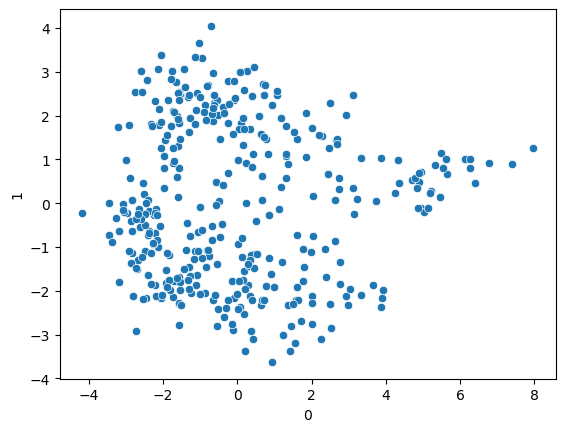

In [45]:
pca = PCA(n_components=2)
pca_mdl = pca.fit_transform(X)
pca_df = pd.DataFrame(pca_mdl)
sns.scatterplot(x = pca_df[0], y = pca_df[1])

Much much better! Let's explore these for clustering.

# Modeling

## K-Means Clustering

In [46]:
inertia = []
for k in range(1,15):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(scaled_X)
    inertia.append(np.sqrt(kmeans.inertia_))

c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are

Text(0, 0.5, 'Variance')

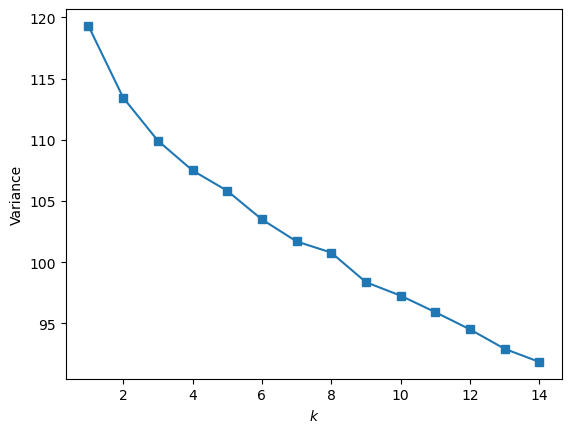

In [47]:
plt.plot(range(1,15), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('Variance')

In [48]:
#create KMeans model
kmeans = KMeans(n_clusters=3, random_state=1).fit(scaled_X)

c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [49]:
y = kmeans.fit_predict(scaled_X)

c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


<Axes: xlabel='0', ylabel='1'>

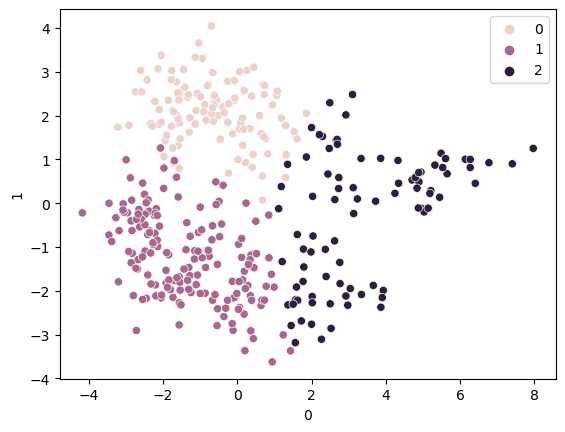

In [50]:
sns.scatterplot(x = pca_df[0], y = pca_df[1], hue=y)

We could also try plotting individual features to take a look.

<Axes: xlabel='Rank', ylabel='Tuition'>

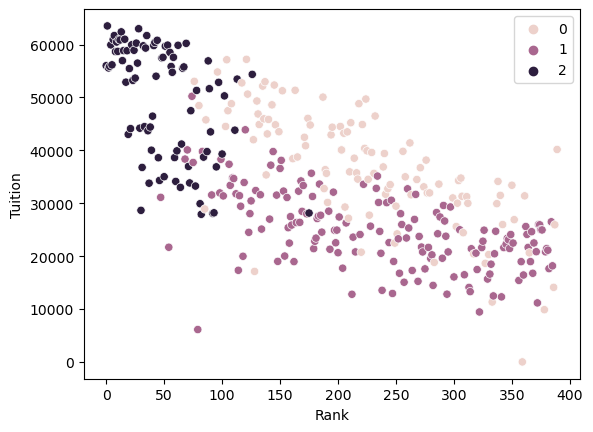

In [51]:
sns.scatterplot(x = df_small['Rank'], y = df_small['Tuition'], hue=y)

<Axes: xlabel='Rank', ylabel='Percent admitted'>

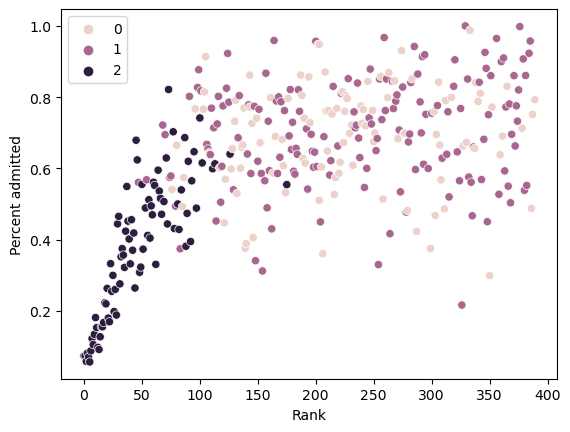

In [52]:
sns.scatterplot(x = df_small['Rank'], y = df_small['Percent admitted'], hue=y)

In [53]:
df_small['Cluster'] = y
df_small

,Name,Rank,Tuition,Enrollment Numbers,Control of institution,Historically Black College or University,Percent of total enrollment that are White,Percent of total enrollment that are women,"Graduation rate Bachelor degree within 4 years, total",Percent of freshmen receiving any financial aid,Endowment assets,Percent undergraduate,Percent fulltime,Percent admitted,Geographic region_Far West AK CA HI NV OR WA,Geographic region_Great Lakes IL IN MI OH WI,Geographic region_Mid East DE DC MD NJ NY PA,Geographic region_New England CT ME MA NH RI VT,Geographic region_Plains IA KS MN MO NE ND SD,Geographic region_Rocky Mountains CO ID MT UT WY,Geographic region_Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Geographic region_Southwest AZ NM OK TX,Degree of urbanization (Urban centric locale)_City: Large,Degree of urbanization (Urban centric locale)_City: Midsize,Degree of urbanization (Urban centric locale)_City: Small,Degree of urbanization (Urban centric locale)_Rural: Fringe,Degree of urbanization (Urban centric locale)_Suburb: Large,Degree of urbanization (Urban centric locale)_Suburb: Midsize,Degree of urbanization (Urban centric locale)_Suburb: Small,Degree of urbanization (Urban centric locale)_Town: Distant,Degree of urbanization (Urban centric locale)_Town: Fringe,Degree of urbanization (Urban centric locale)_Town: Remote,Carnegie Classification 2010: Basic_Baccalaureate Colleges Arts & Sciences,Carnegie Classification 2010: Basic_Baccalaureate Colleges Diverse Fields,Carnegie Classification 2010: Basic_Doctoral/Research Universities,Carnegie Classification 2010: Basic_Master's Colleges and Universities (larger programs),Carnegie Classification 2010: Basic_Master's Colleges and Universities (medium programs),Carnegie Classification 2010: Basic_Master's Colleges and Universities (smaller programs),Carnegie Classification 2010: Basic_Research Universities (high research activity),Carnegie Classification 2010: Basic_Research Universities (very high research activity),Cluster
0,Princeton University,0.000,56010.000,8014.000,0,0,45.000,45.000,88.000,60.000,2320421.000,0.664,0.985,0.074,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2
1,Columbia University,1.000,63530.000,26957.000,0,0,36.000,51.000,86.000,57.000,316753.000,0.296,0.925,0.074,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2
2,Harvard University,2.000,55587.000,28297.000,0,0,45.000,49.000,87.000,75.000,1392761.000,0.372,0.687,0.058,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2
3,Massachusetts Institute of Technology,3.000,55878.000,11301.000,0,0,34.000,37.000,84.000,87.000,980404.000,0.401,0.994,0.082,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2
4,Yale University,4.000,59950.000,12109.000,0,0,48.000,49.000,90.000,61.000,1528324.000,0.448,0.999,0.071,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,Western Kentucky University,384.000,26496.000,20448.000,1,0,77.000,58.000,25.000,93.000,945.000,0.856,0.764,0.923,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
387,Wichita State University,385.000,18166.000,14386.000,1,0,63.000,52.000,22.000,89.000,17845.000,0.811,0.755,0.958,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
388,William Carey University,386.000,14100.000,3882.000,0,0,64.000,66.000,46.000,92.000,2958.000,0.581,0.836,0.488,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
389,William Woods University,387.000,25930.000,2136.000,0,0,84.000,68.000,45.000,100.000,11097.000,0.469,0.841,0.751,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0


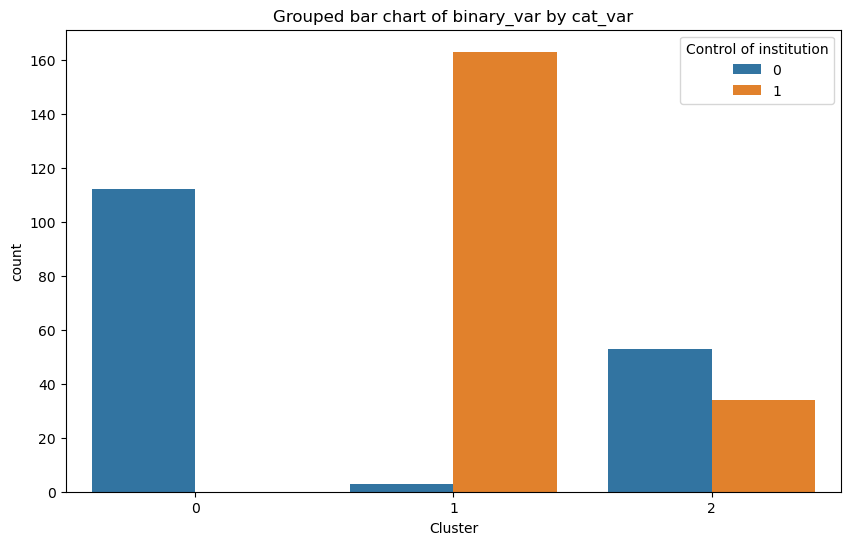

In [54]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', hue='Control of institution', data=df_small)
plt.title('Grouped bar chart of binary_var by cat_var')
plt.show()

Despite my attempts, it looks like it largeley ended up being public-private split. Let's see if I can try again and avoid this...

Let's add our clusters back to the original DataFrame so we can take a look at some of the items.  

<hr>

## Agglomerative Clustering

Agglomerative clustering is hierarchichal instead of centroid, and instead creates a top down or bottom up tree of clusters. Each point begins as its own cluster, then the closest pairs are merged. This repeats until a crterion is met.

We have already done some pre-processing, but to keep things together for this practice, lets put them here again! We will be using the same "X" from K-Means with HP, Attack, Defense, Special Attack and Special Defense with Speed as well. 

Let's figure out how many clusters is optimal for this model. Agglomerative Clustering used a dendrogram to determine this number!



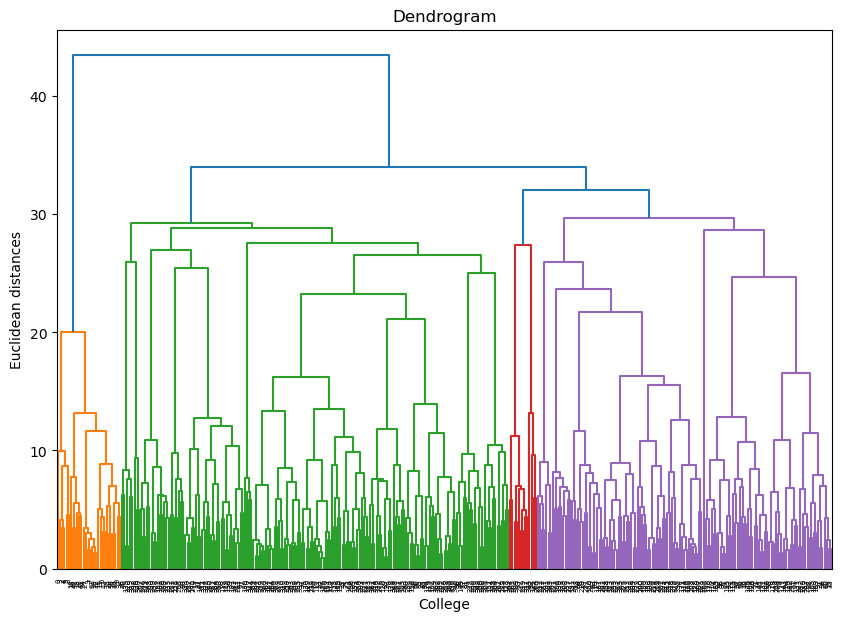

In [55]:
#Create and display a dendrogram
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))  
plt.title('Dendrogram')
plt.xlabel('College')
plt.ylabel('Euclidean distances')
plt.axhline(y=825, color='r', linestyle='--')
plt.axhline(y=1575, color='r', linestyle='--')
dend = shc.dendrogram(shc.linkage(X, method='ward'))


The largest width on this graph is at first split of the green line, so once again the ideal number of clusters is 3.

After determining what the optimal number of clusters is, input it into the model implementation below!

In [56]:
#Implement model
agglo = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')  

Now lets fit and create some prediction to visualize the clusters! 

In [57]:
y_agglo = agglo.fit_predict(X)

c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Now let's visualize! We will once again be using PCA to do so. 

<Axes: xlabel='0', ylabel='1'>

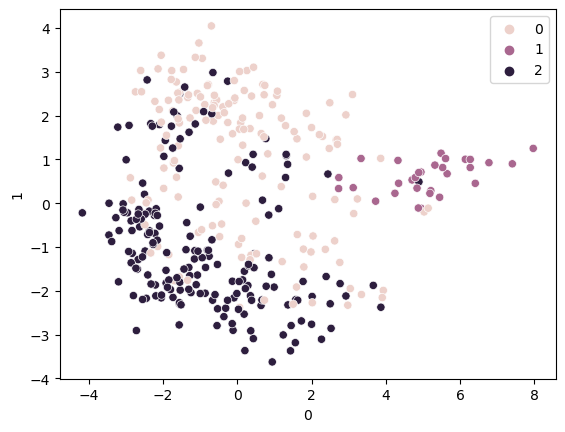

In [58]:
sns.scatterplot(x = pca_df[0], y = pca_df[1], hue=y_agglo)

<Axes: xlabel='Rank', ylabel='Tuition'>

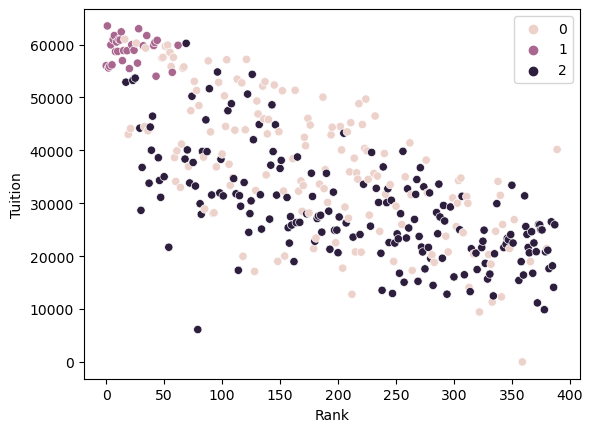

In [59]:
sns.scatterplot(x = df_small['Rank'], y = df_small['Tuition'], hue=y_agglo)

In [60]:
df_small['Cluster_agglo'] = y_agglo
df_small

,Name,Rank,Tuition,Enrollment Numbers,Control of institution,Historically Black College or University,Percent of total enrollment that are White,Percent of total enrollment that are women,"Graduation rate Bachelor degree within 4 years, total",Percent of freshmen receiving any financial aid,Endowment assets,Percent undergraduate,Percent fulltime,Percent admitted,Geographic region_Far West AK CA HI NV OR WA,Geographic region_Great Lakes IL IN MI OH WI,Geographic region_Mid East DE DC MD NJ NY PA,Geographic region_New England CT ME MA NH RI VT,Geographic region_Plains IA KS MN MO NE ND SD,Geographic region_Rocky Mountains CO ID MT UT WY,Geographic region_Southeast AL AR FL GA KY LA MS NC SC TN VA WV,Geographic region_Southwest AZ NM OK TX,Degree of urbanization (Urban centric locale)_City: Large,Degree of urbanization (Urban centric locale)_City: Midsize,Degree of urbanization (Urban centric locale)_City: Small,Degree of urbanization (Urban centric locale)_Rural: Fringe,Degree of urbanization (Urban centric locale)_Suburb: Large,Degree of urbanization (Urban centric locale)_Suburb: Midsize,Degree of urbanization (Urban centric locale)_Suburb: Small,Degree of urbanization (Urban centric locale)_Town: Distant,Degree of urbanization (Urban centric locale)_Town: Fringe,Degree of urbanization (Urban centric locale)_Town: Remote,Carnegie Classification 2010: Basic_Baccalaureate Colleges Arts & Sciences,Carnegie Classification 2010: Basic_Baccalaureate Colleges Diverse Fields,Carnegie Classification 2010: Basic_Doctoral/Research Universities,Carnegie Classification 2010: Basic_Master's Colleges and Universities (larger programs),Carnegie Classification 2010: Basic_Master's Colleges and Universities (medium programs),Carnegie Classification 2010: Basic_Master's Colleges and Universities (smaller programs),Carnegie Classification 2010: Basic_Research Universities (high research activity),Carnegie Classification 2010: Basic_Research Universities (very high research activity),Cluster,Cluster_agglo
0,Princeton University,0.000,56010.000,8014.000,0,0,45.000,45.000,88.000,60.000,2320421.000,0.664,0.985,0.074,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1
1,Columbia University,1.000,63530.000,26957.000,0,0,36.000,51.000,86.000,57.000,316753.000,0.296,0.925,0.074,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1
2,Harvard University,2.000,55587.000,28297.000,0,0,45.000,49.000,87.000,75.000,1392761.000,0.372,0.687,0.058,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1
3,Massachusetts Institute of Technology,3.000,55878.000,11301.000,0,0,34.000,37.000,84.000,87.000,980404.000,0.401,0.994,0.082,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1
4,Yale University,4.000,59950.000,12109.000,0,0,48.000,49.000,90.000,61.000,1528324.000,0.448,0.999,0.071,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,Western Kentucky University,384.000,26496.000,20448.000,1,0,77.000,58.000,25.000,93.000,945.000,0.856,0.764,0.923,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,2
387,Wichita State University,385.000,18166.000,14386.000,1,0,63.000,52.000,22.000,89.000,17845.000,0.811,0.755,0.958,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,2
388,William Carey University,386.000,14100.000,3882.000,0,0,64.000,66.000,46.000,92.000,2958.000,0.581,0.836,0.488,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,2
389,William Woods University,387.000,25930.000,2136.000,0,0,84.000,68.000,45.000,100.000,11097.000,0.469,0.841,0.751,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,2


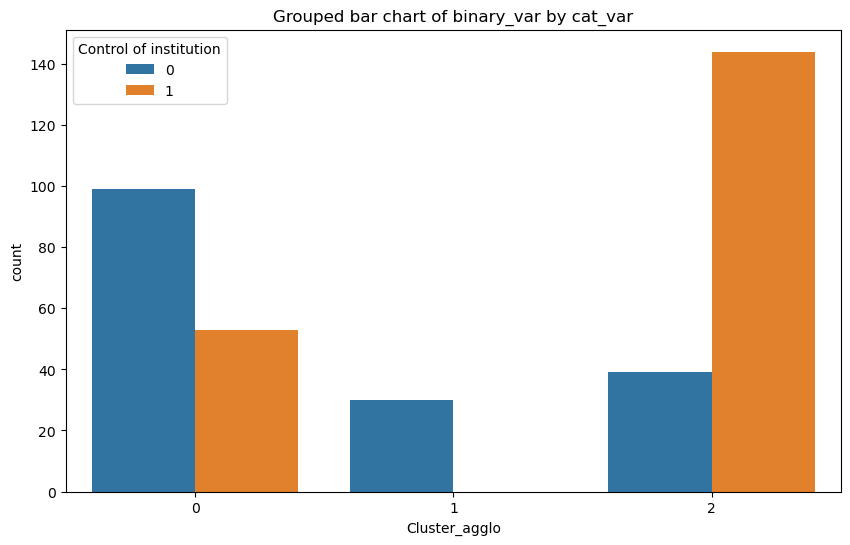

In [61]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster_agglo', hue='Control of institution', data=df_small)
plt.title('Grouped bar chart of binary_var by cat_var')
plt.show()

<Axes: xlabel='Rank', ylabel='Tuition'>

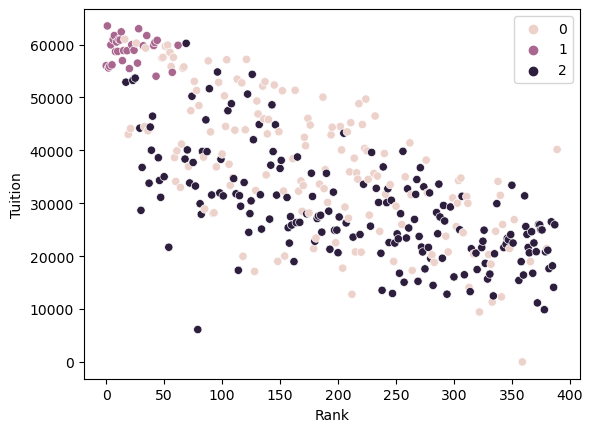

In [62]:
sns.scatterplot(x = df['Rank'], y = df['Tuition'], hue=y_agglo)

## Testing without some features and 20 clusters just for funsies

In [63]:
no_heavy = X.drop(columns=['Rank','Tuition','Control of institution'])
scaler = preprocessing.StandardScaler()
new_X = scaler.fit_transform(no_heavy)
new_X = pd.DataFrame(new_X, columns=no_heavy.columns)

In [64]:
#create KMeans model
kmeans = KMeans(n_clusters=3, random_state=1).fit(new_X)

c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [81]:
inertia = []
for k in range(1,100):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(new_X)
    inertia.append(np.sqrt(kmeans.inertia_))

c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are

Text(0, 0.5, 'Variance')

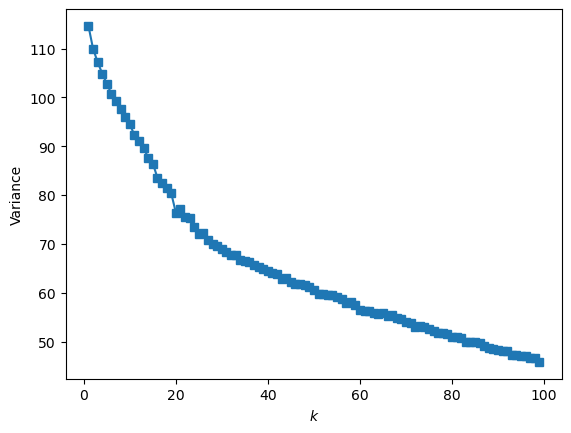

In [82]:
plt.plot(range(1,100), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('Variance')

In [83]:
#create KMeans model
kmeans = KMeans(n_clusters=20, random_state=1).fit(new_X)

c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [84]:
y = kmeans.fit_predict(new_X)

c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\jesse\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


<Axes: xlabel='0', ylabel='1'>

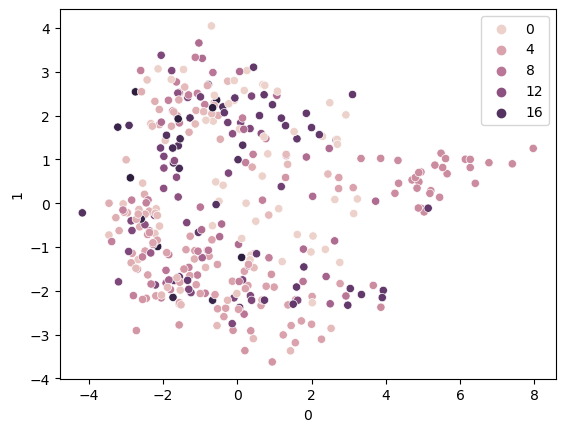

In [85]:
sns.scatterplot(x = pca_df[0], y = pca_df[1], hue=y)

We could also try plotting individual features to take a look.

<Axes: xlabel='Rank', ylabel='Tuition'>

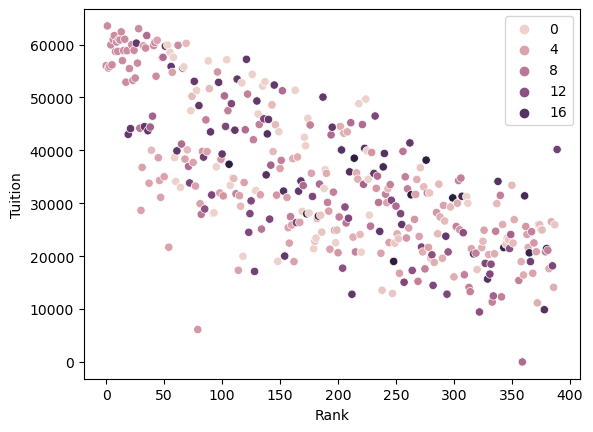

In [86]:
sns.scatterplot(x = df_small['Rank'], y = df_small['Tuition'], hue=y)

<Axes: xlabel='Rank', ylabel='Percent admitted'>

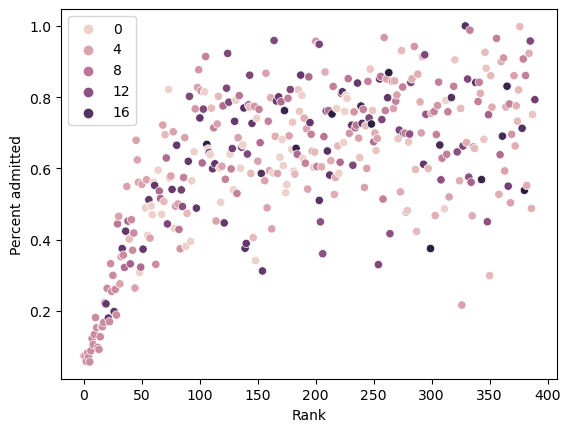

In [87]:
sns.scatterplot(x = df_small['Rank'], y = df_small['Percent admitted'], hue=y)